# Проект: классификация

Александр Журавлев DST-120
***

# Задача
→ Банкам хотелось бы уметь выбирать среди своих клиентов именно тех, которые с наибольшей вероятностью воспользуются тем или иным предложением, и связываться именно с ними.

Представленны данные о последней маркетинговой кампании, которую проводил банк: задачей было привлечь клиентов для открытия депозита. Вы должны проанализировать эти данные, выявить закономерность и найти решающие факторы, повлиявшие на то, что клиент вложил деньги именно в этот банк. Если вы сможете это сделать, то поднимете доходы банка и поможете понять целевую аудиторию, которую необходимо привлекать путём рекламы и различных предложений.

**Бизнес-задача:** определить характеристики, по которым можно выявить клиентов, более склонных к открытию депозита в банке, и за счёт этого повысить результативность маркетинговой кампании.

**Техническая задача** для вас как для специалиста в Data Science: построить модель машинного обучения, которая на основе предложенных характеристик клиента будет предсказывать, воспользуется он предложением об открытии депозита или нет.

### Данные о клиентах банка:

- **age** (возраст);
- **job** (сфера занятости);
- **marital** (семейное положение);
- **education** (уровень образования);
- **default** (имеется ли просроченный кредит);
- **housing** (имеется ли кредит на жильё);
- **loan** (имеется ли кредит на личные нужды);
- **balance** (баланс).

### Данные, связанные с последним контактом:

- **contact** (тип контакта с клиентом);
- **month** (месяц, в котором был последний контакт);
- **day** (день, в который был последний контакт);
- **duration** (продолжительность контакта в секундах).

### Прочие признаки:

- **campaign** (количество контактов с этим клиентом в течение текущей кампании);
- **pdays** (количество пропущенных дней с момента последней маркетинговой кампании до контакта в текущей кампании);
- **previous** (количество контактов до текущей кампании)
- **poutcome** (результат прошлой маркетинговой кампании).

### Целевой признак:

- **deposit**.

***
***

# Итерация №1. Baseline.

Ключевой проблемой датасета, на мой взгляд, являются пропущенные значения (в первую очередь неявные пропуски в категориальных признаках). На данной итерации попробуем 3 варианта решения данной проблемы:
- удалим пропуски
- заменим пропуски константами
- предскажем пропущенные значения, используя ML    
    
Выполним самый простой анализ данных, обучим несколько моделей с параметрами по умолчанию.    
Сравним результаты и сделаем выводы.

**Примечание:** при перезапуске ноутбука значения некоторых метрик у некоторых моделей могут менятся +/- на 0.01   
Вероятно, это происходит по причине того, что алгоритмы sklearn по очистке данных носят стохастический характер.

***
***

## Определение целевой метрики

Целевой признак **deposit** имеет 2 значения - 'yes' (клиент открывает депозит) и 'no' (клиент депозит не открывает). Наша цель - научиться выявлять клиентов, готовых открыть депозит. Соответственно, целевой класс таргета = 'yes' = 1.

В базе данных более 11тыс. клиентов. Связь с клиентами осуществляется через колл-центр (судя по значениям признака **contact**). Обычно, ресурсы колл-центра ограничены. Следовательно, целевой метрикой должен быть *precision*. С другой стороны, это нам в условиях задания явно не указано. В таком случае, полагаю целесообразным, использовать метрику *F1-score*, как среднее гармоническое метрик *precision* и *recall*. В свою очередь, метрика *accuracy* нам не подойдет, т.к. есть дисбаланс классов. В любом случае, вопрос метрики можно уточнить у заказчика, выяснив что ему более важно - точное выделение клиентов готовых открыть депозит или наибольший их охват, с учетом возможностей колл-центра.

## 0. Подготовительный этап

### Импортируем необходимые библиотеки

In [1]:

# импорт библиотек
import numpy as np # для матричных вычислений
import pandas as pd # для анализа и предобработки данных
import matplotlib.pyplot as plt # для визуализации
import seaborn as sns # для визуализации

from sklearn import linear_model # линейные модели
from sklearn import tree # деревья решений
from sklearn import ensemble # ансамбли
from sklearn import metrics # метрики
from sklearn import preprocessing # предобработка
from sklearn import model_selection
from sklearn.model_selection import train_test_split # сплитование выборки
from sklearn.covariance import EllipticEnvelope # выявляем выбросы

# не отображаем предупреждения
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

# настройка визуализации
%matplotlib inline
plt.style.use('seaborn')
%config InlineBackend.figure_format = 'svg'

# из файла с функциями my_functions.py
from my_functions import encode_cat_features # для OneHotEncoding тренировочной и тестовой выборок

### Определим некоторые настройки и константы, загрузим данные

In [2]:
# для воспроизводимости результатов
random_state = 42 

In [3]:
# загрузим данные
df = pd.read_csv('data/bank_fin.csv', sep = ';')

***

## 1. Исследование данных

### 1.1. Знакомство с данными

In [4]:
# ознакомимся с данными
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,"2 343,00 $",yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,"45,00 $",no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,"1 270,00 $",yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,"2 476,00 $",yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,"184,00 $",no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11137 non-null  object
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(6), object(11)
memory usage: 1.4+ MB


In [6]:
# поиск дубликатов
df_duplicates = df[df.duplicated()]
print(f'Число найденных дубликатов: {df_duplicates.shape[0]}')

Число найденных дубликатов: 0


In [7]:
# исследуем данные на наличие пропусков
df.isnull().sum()

age           0
job           0
marital       0
education     0
default       0
balance      25
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
deposit       0
dtype: int64

### 1.2. Преобразование признаков

Преобразуем признак **balance** в числовой. 

In [8]:
# заменим пропуски, запятые и знак доллара в значениях признака balance
df.balance = df.balance.apply(
    lambda x: str(x).translate(str.maketrans({
        ' ': '', # убираем пробелы
        '$': '', # убираем знак $
        ',': '.' # заменяем запятую на точку
    }))
)

# преобразуем тип признака balance из object в float
df.balance = df.balance.astype(float)

### 1.3. Визуализация признаков

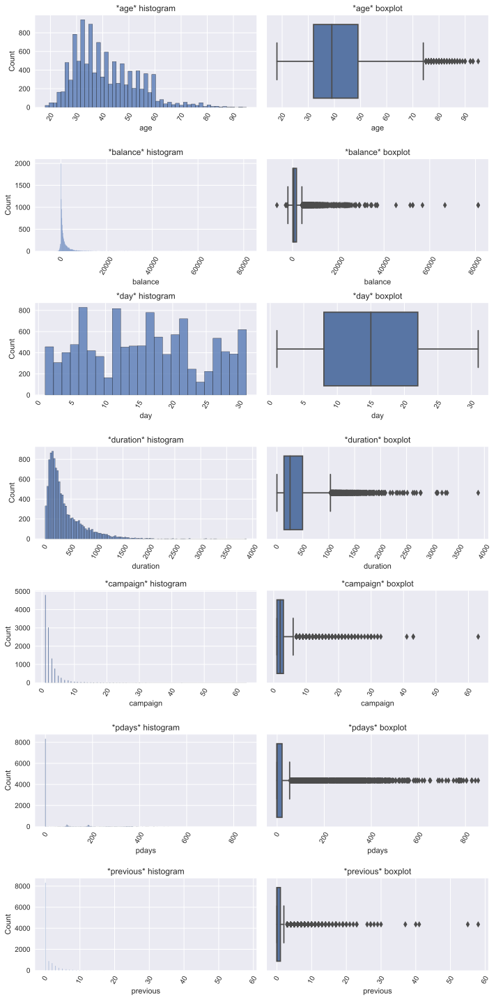

In [9]:
# визуализируем числовые признаки

# выделим числовые признаки в список
types = df.dtypes
num_features = list(types[(types == 'int64') | (types == 'float64')].index)

# получим длину списка с признаками
n = len(num_features)

# выведем диаграммы признаков
fig, axes = plt.subplots(n, 2, figsize=(10, 20)) # фигура + (n * 2) координатных плоскостей
# создаем цикл для всех признаков 
for i,feature in enumerate(num_features):
    # первый график в строке - гистограмма
    histogram = sns.histplot(data=df, x=feature, ax=axes[i][0])
    histogram.xaxis.set_tick_params(rotation=60)
    histogram.set_title(f'*{feature}* histogram')
    # второй график в строке - ящик с усами
    boxplot = sns.boxplot(data=df, x=feature, ax=axes[i][1])
    boxplot.xaxis.set_tick_params(rotation=60)
    boxplot.set_title(f'*{feature}* boxplot')
    # выравнивание графиков
    plt.tight_layout() 

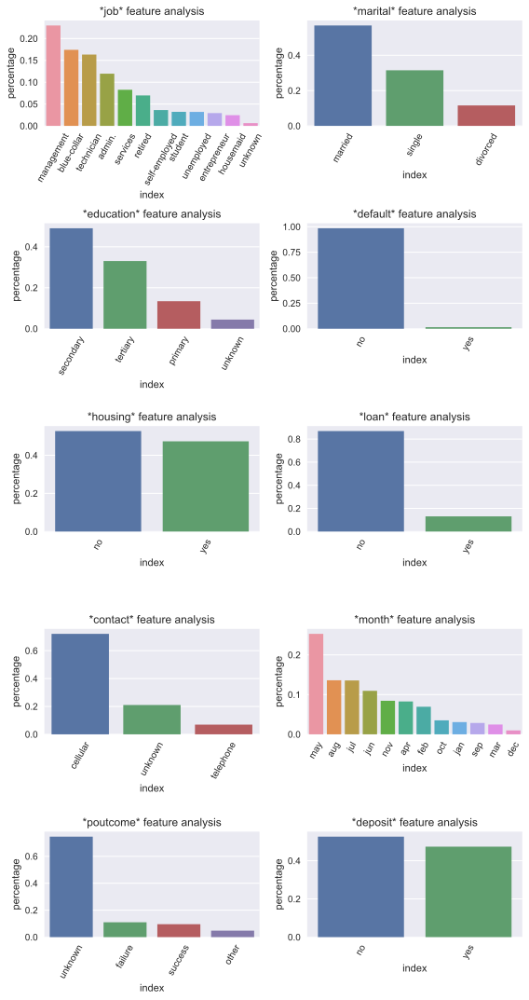

In [10]:
# визуализируем категориальные признаки

# выделим категориальные признаки в список
types = df.dtypes
cat_features = list(types[(types == 'object')].index)

# получим длину списка с признаками
n = len(cat_features)
# если значение нечетное
if n % 2 != 0:
    # продублируем последнее значение списка
    cat_features.append(cat_features[-1])
    # обновим длину списка
    n = len(cat_features)

# соединим признаки в списке по два 
cat_features = zip(cat_features[::2], cat_features[1::2])

# для удобства выведем диаграммы с признаками по две в строку
fig, axes = plt.subplots(int(n/2), 2, figsize=(8, 15)) # фигура + (n/2 * 2) координатных плоскостей
# создаем цикл для всех пар признаков 
for i, feature_pair in enumerate(cat_features):
    # первый график в строке
    # строим количественную столбчатую для долевого соотношения каждой из категорий в данных
    count_data = (df[feature_pair[0]].value_counts(normalize=True)
                  .sort_values(ascending=False)
                  .rename('percentage')
                  .reset_index()
    )
    count_barplot = sns.barplot(data=count_data, x='index', y='percentage', ax=axes[i][0])
    count_barplot.xaxis.set_tick_params(rotation=60)
    count_barplot.set_title(f'*{feature_pair[0]}* feature analysis')
    # второй график в строке
    # строим количественную столбчатую для долевого соотношения каждой из категорий в данных
    count_data = (df[feature_pair[1]].value_counts(normalize=True)
                  .sort_values(ascending=False)
                  .rename('percentage')
                  .reset_index()
    )
    count_barplot = sns.barplot(data=count_data, x='index', y='percentage', ax=axes[i][1])
    count_barplot.xaxis.set_tick_params(rotation=60)
    count_barplot.set_title(f'*{feature_pair[1]}* feature analysis')
    # выравнивание графиков
    plt.tight_layout() 

**Выводы:**
- в признаке **balance** имеется 25 явных пропусков
- этот признак должен быть числовым, однако изнаально принадлежал классу *object* - был преобразован
- присутствуют неявные пропуски *unknown* в признаках **job**, **education**, **contact** и **poutcome** 
- доля неявных пропусков в **poutcome** превышает 70%

### 1.4. Исследование пропусков

Преобразуем неявные пропуски в явные

In [11]:
# список признаков с неявными пропусками
nan_category_features = ['job', 'education', 'contact', 'poutcome']

# превращаем неявные пропуски в явные
for feature in nan_category_features:
    df[feature] = df[feature].apply(
        lambda x: np.nan if x == 'unknown' else x
    )

Исследуем пропущенные значения

poutcome     74.592367
contact      21.017739
education     4.452607
job           0.627128
balance       0.223974
dtype: float64

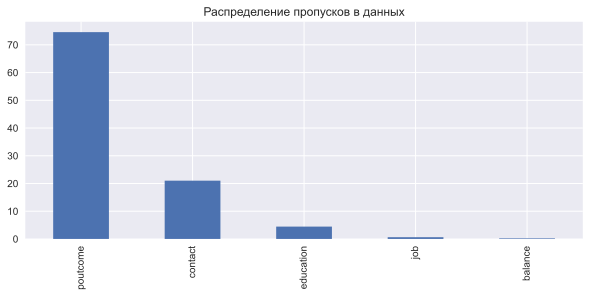

In [12]:
# выводим процент пропусков в признаках
cols_nan_percent = df.isnull().mean() * 100
cols_with_nan = cols_nan_percent[cols_nan_percent>0].sort_values(ascending=False)
display(cols_with_nan)

# визуализируем полученные данные
cols_with_nan.plot(
    kind='bar',
    figsize=(10, 4),
    title='Распределение пропусков в данных'
);

In [13]:
# тепловая карта пропусков
colors = ['blue', 'yellow'] 
fig = plt.figure(figsize=(10, 5))
cols = cols_with_nan.index
ax = sns.heatmap(
    df[cols].isnull(),
    cmap=sns.color_palette(colors),
)

**Выводы:**
- пропуски содержаться в признаках (по убыванию): **poutcome**, **contact**, **education**, **job**, **balance**
- признак **poutcome** содержит почти 75% пропусков
- на данном этапе пропуски удалим
    - признак **poutcome** удалим полностью (>70% пропущенных значений)
    - удалим строки с оставшимися пропусками 

In [14]:
# удалим признак poutcome
df_dropna = df.drop('poutcome', axis=1)

# удалим строки с пропусками
df_dropna = df_dropna.dropna()

print(f'Размер данных до удаления пропусков {df.shape}')
print(f'Размер данных после удаления пропусков {df_dropna.shape}')
reduction_percentage = 100 - df_dropna.shape[0] / df.shape[0] * 100
print(f'Датасет уменьшился на {round(reduction_percentage)} %')

Размер данных до удаления пропусков (11162, 17)
Размер данных после удаления пропусков (8376, 16)
Датасет уменьшился на 25 %


## 2.  Разведывательный анализ

In [15]:
# получим соотношение классов таргета ДО удаления пропусков
display(df.deposit.value_counts(normalize=True))

no     0.52616
yes    0.47384
Name: deposit, dtype: float64

In [16]:
# получим соотношение классов таргета ПОСЛЕ удаления пропусков
display(df_dropna.deposit.value_counts(normalize=True))

yes    0.538324
no     0.461676
Name: deposit, dtype: float64

Видно, что классы несбалансированы. Но что еще интересно - до удаления пропусков было больше клиентов которые не открывали депозит, а после удаления наоборот (цифры изменились практически зеркально).

## 3. Подготовка данных

### 3.1. Выделяем целевую переменную и предикторы, разделяем выборку на обучающую и тестовую.

In [17]:
# X - матрица наблюдений, y - столбец правильных ответов
X = df_dropna.drop('deposit', axis=1)
y = df_dropna['deposit']

In [18]:
# Создаем тренировочную и тестовую выборки с помощью train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, # таблица с наблюдениями и столбец с правильным ответами
    test_size=0.2, # размер тестовой выборки
    random_state=random_state, # число отвечающее за генерацию случайных чисел
    stratify=y # стратификация, т.к. таргент несбалансирован
)

# Выводим размеры полученных выборок
print('Train shape: {}'.format(X_train.shape))
print('Test shape: {}'.format(X_test.shape))

Train shape: (6700, 15)
Test shape: (1676, 15)


### 3.2. Кодируем признаки

In [19]:
# признаки для OneHotEncoding
columns_to_change = [
    'job',
    'marital',
    'education',
    'default',
    'housing',
    'loan',
    'contact',
    'day',
    'month'
]
# кодируем тренировочную и тестовую выборки по отдельности, обучаясь на тренировочной
X_train_new, X_test_new = encode_cat_features(columns_to_change, X_train, X_test, y_train)

### 3.3. Поиск выбросов

Мы уже лишились 25% датасета, поэтому выбросы пометим, но удалять не будем.

In [20]:
# создаем признак для пометки выбросов
X_train_new['ouliers'] = 0
X_test_new['ouliers'] = 0

# попробуем класс EllipticEnvelope 
ee = EllipticEnvelope(contamination=0.01)
# обучаем и находим выбросы на тренировочной выборке
y_predicted_train = ee.fit_predict(X_train_new) 
# находим выбросы на тестовой выборке
y_predicted_test = ee.predict(X_test_new) 

# помечаем выбросы на тренировочной выборке
mask = y_predicted_train == -1
X_train_new.loc[mask, 'ouliers'] = 1

# помечаем выбросы на тестовой выборке
mask = y_predicted_test == -1
X_test_new.loc[mask, 'ouliers'] = 1

### 3.4. Нормализуем данные

In [21]:
# нормализуем данные

scaler = preprocessing.RobustScaler()             # RobustScaler показал себя чуть лучше
scaler.fit(X_train_new)                           # fit() только на train данных
X_train_scaled = scaler.transform(X_train_new)    # fransform() на train данных
X_test_scaled = scaler.transform(X_test_new)      # fransform() на test данных

## 4. Решение задачи классификации: логистическая регрессия и решающие деревья

### 4.1. Логистическая регрессия

In [22]:
# Создаём модель логистической регрессии
model_lr = linear_model.LogisticRegression(
    random_state = random_state
    )
 
# обучаем модель
model_lr.fit(X_train_scaled, y_train)

# делаем предсказание на тренировочной и тестовой выборке
y_train_pred = model_lr.predict(X_train_scaled)
y_test_pred = model_lr.predict(X_test_scaled)

# расчитываем и выводим метрику на тренировочной выборке
print('Train scores')
print(metrics.classification_report(y_train, y_train_pred))
print('-' * 60)
print('Test scores')
# расчитываем и выводим метрику на тестовой выборке
print(metrics.classification_report(y_test, y_test_pred))

Train scores
              precision    recall  f1-score   support

          no       0.79      0.80      0.80      3093
         yes       0.83      0.82      0.82      3607

    accuracy                           0.81      6700
   macro avg       0.81      0.81      0.81      6700
weighted avg       0.81      0.81      0.81      6700

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.78      0.80      0.79       774
         yes       0.82      0.81      0.82       902

    accuracy                           0.80      1676
   macro avg       0.80      0.80      0.80      1676
weighted avg       0.81      0.80      0.80      1676



### 4.2. Дерево решений

In [23]:
# Создаём объект класса DecisionTreeClassifier
model_dt = tree.DecisionTreeClassifier(
    random_state = random_state 
)

# Обучаем дерево решений 
model_dt.fit(X_train_scaled, y_train)

# Делаем предсказание класса для тренировочных и тестовых данных
y_train_pred = model_dt.predict(X_train_scaled)
y_test_pred = model_dt.predict(X_test_scaled)

#Выводим отчёт о метриках классификации
print('Train scores')
print(metrics.classification_report(y_train, y_train_pred))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_test_pred))

Train scores
              precision    recall  f1-score   support

          no       1.00      1.00      1.00      3093
         yes       1.00      1.00      1.00      3607

    accuracy                           1.00      6700
   macro avg       1.00      1.00      1.00      6700
weighted avg       1.00      1.00      1.00      6700

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.72      0.74      0.73       774
         yes       0.77      0.75      0.76       902

    accuracy                           0.75      1676
   macro avg       0.74      0.75      0.74      1676
weighted avg       0.75      0.75      0.75      1676



На примере дерева решений определим важность признаков

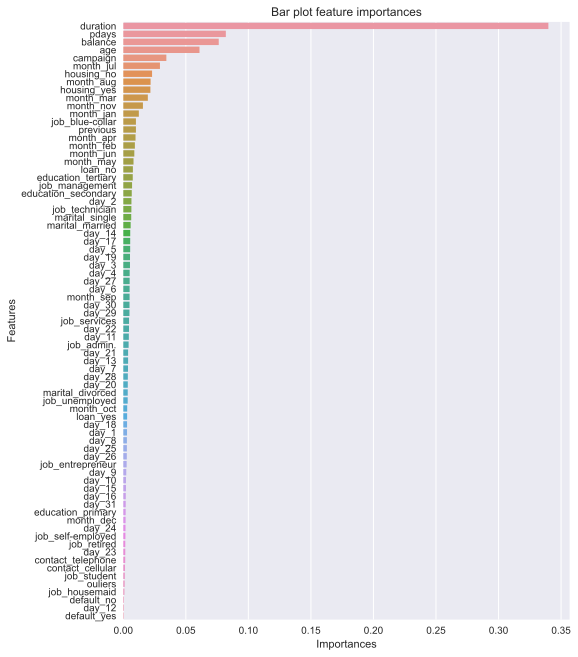

In [24]:
fig, ax = plt.subplots(figsize=(8, 11)) # фигура + координатная плоскость
feature = X_train_new.columns #признаки
feature_importances = model_dt.feature_importances_ # важность признаков
# создаем объект Series, чтобы отсортировать по важности признаки
feature_importances_series = pd.Series(
    data=feature_importances,
    index=feature
).sort_values(ascending=False)
# Строим столбчатую диаграмму
sns.barplot(x=feature_importances_series, y=feature_importances_series.index, ax=ax);
# Добавляем подпись графику, осям абцисс и ординат
ax.set_title('Bar plot feature importances')
ax.set_xlabel('Importances')
ax.set_ylabel('Features');

**Выводы:**
- модель логистической регрессии показала себя лучше
- модель дерева решений имеет явные признаки переобучения
- наиболее важные признаки (по убыванию): **duration**, **pdays**, **balance**, **age** и т.д.

## 5. Решение задачи классификации: ансамбли моделей

### 5.1. Случайный лес

In [25]:
# Создаем объект класса случайный лес
model_rf = ensemble.RandomForestClassifier(
    random_state = random_state 
)

# Обучаем модель 
model_rf.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = model_rf.predict(X_train_scaled)
y_pred_test = model_rf.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       1.00      1.00      1.00      3093
         yes       1.00      1.00      1.00      3607

    accuracy                           1.00      6700
   macro avg       1.00      1.00      1.00      6700
weighted avg       1.00      1.00      1.00      6700

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.86      0.76      0.81       774
         yes       0.82      0.89      0.85       902

    accuracy                           0.83      1676
   macro avg       0.84      0.83      0.83      1676
weighted avg       0.83      0.83      0.83      1676



Неплохая метрика *F1-score* = 0.85, однако модель явно переобучена.  
Определим важность признаков для данной модели.

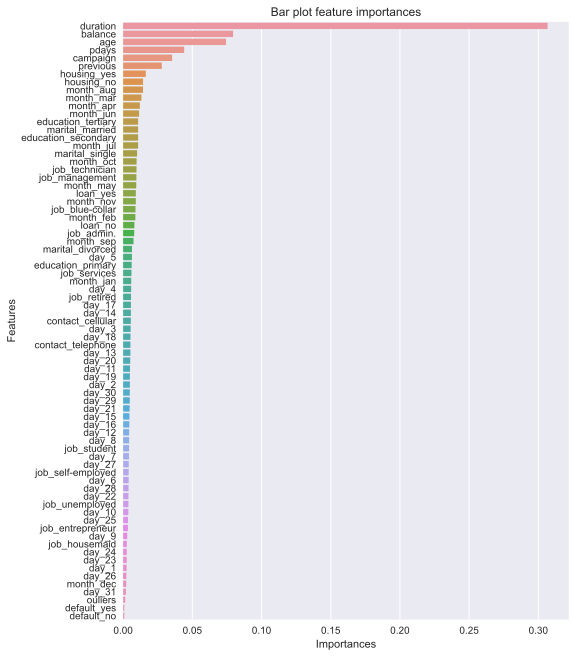

In [26]:
fig, ax = plt.subplots(figsize=(8, 11)) # фигура + координатная плоскость
feature = X_train_new.columns #признаки
feature_importances = model_rf.feature_importances_ # важность признаков
# создаем объект Series, чтобы отсортировать по важности признаки
feature_importances_series = pd.Series(
    data=feature_importances,
    index=feature
).sort_values(ascending=False)
# Строим столбчатую диаграмму
sns.barplot(x=feature_importances_series, y=feature_importances_series.index, ax=ax);
# Добавляем подпись графику, осям абцисс и ординат
ax.set_title('Bar plot feature importances')
ax.set_xlabel('Importances')
ax.set_ylabel('Features');

Четверка лидеров та же, ниже уже имеются различия.

### 5.2. Градиентный бустинг

In [27]:
# Создаем объект класса градиентный бустинг
model_gb = ensemble.GradientBoostingClassifier(
    random_state = random_state
)

model_gb.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = model_gb.predict(X_train_scaled)
y_pred_test = model_gb.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       0.86      0.80      0.83      3093
         yes       0.84      0.89      0.86      3607

    accuracy                           0.85      6700
   macro avg       0.85      0.85      0.85      6700
weighted avg       0.85      0.85      0.85      6700

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.85      0.79      0.82       774
         yes       0.83      0.88      0.85       902

    accuracy                           0.84      1676
   macro avg       0.84      0.83      0.83      1676
weighted avg       0.84      0.84      0.84      1676



### 5.3. Стекинг

In [28]:
# Создаем список кортежей вида: (наименование модели, модель)
estimators = [
    ('log_reg', linear_model.LogisticRegression(
        random_state = random_state
    )),
    ('dt',  tree.DecisionTreeClassifier(
        random_state = random_state
    )),
    ('gb', ensemble.GradientBoostingClassifier(
        random_state = random_state
    ))
]

# Создаем объект класса стекинг
stacking_cl = ensemble.StackingClassifier(
    estimators=estimators,
    final_estimator=linear_model.LogisticRegression(
        random_state = random_state
    )
)

# Обучаем модель
stacking_cl.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = stacking_cl.predict(X_train_scaled)
y_pred_test = stacking_cl.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       0.88      0.83      0.85      3093
         yes       0.86      0.90      0.88      3607

    accuracy                           0.87      6700
   macro avg       0.87      0.86      0.86      6700
weighted avg       0.87      0.87      0.87      6700

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.84      0.79      0.81       774
         yes       0.83      0.87      0.85       902

    accuracy                           0.83      1676
   macro avg       0.83      0.83      0.83      1676
weighted avg       0.83      0.83      0.83      1676



Модели градиентного бустинга и стекинга показали себя лучше - 0.85 по целевой метрике, явных признаков переобучения не отмечается.

## 6. Итоги

Сведем полученные метрики моделей в таблицу.

<style type="text/css">
.tg  {border-collapse:collapse;border-spacing:0;}
.tg td{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-ihq5{background-color:#B0B3B2;color:#FB0207;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-9kw6{background-color:#B0B3B2;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-h2pf{background-color:#D4D4D4;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-8mdw{background-color:#B0B3B2;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-zvyz{background-color:#B0B3B2;text-align:left;vertical-align:top}
.tg .tg-rfng{background-color:#D4D4D4;text-align:left;vertical-align:top}
.tg .tg-0lax{text-align:left;vertical-align:top}
.tg .tg-pkkx{color:#E6000E;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-8mdw">Выборка</th>
    <th class="tg-9kw6" colspan="4">Train</th>
    <th class="tg-ihq5" colspan="4">Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-8mdw">Метрики</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-9kw6">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-ihq5">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
  </tr>
  <tr>
    <td class="tg-8mdw">Модели</td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Логистическая регрессия</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Дерево решений</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.77</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Случайный лес</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.89</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Градиентный бустинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.89</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Стекинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.90</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
</tbody>
</table>

**Выводы:**
- видно, что модели дерева решений и случайного леса переобучены
- ансамбли моделей показали себя лучше, чем отдельные модели
- все 3 ансамблевые модели показали значение целевой метрики = 0.85. 
- в то же время модель логистической регрессии показала минимальный разброс метрик *precision*/*recall*/*f1-score*, у остальных моделей имеется разброс между значениями метрик: у ансамблей *precision* сильно ниже, а *recall* выше целевой метрики (у дерева решений наоборот)
- были выявлены самые важные признаки для обучения моделей на основе деревьев - **duration**, **balance**, **pdays**, **age** и пр.

***

# Итерация №1. Baseline. Замена пропусков константами

После разделения датасета на тренировочную и тестовую выборки пропуски в них будут замены на константы в сгруппированных даных по классам таргета. Для этого сделаем копию признака deposit, т.к. данный признак будет удален из тренировочной и тестовой выборок после разделения.

**Примечание:** отмечено, что при замене пропусков в признаке **poutcome** (напомню, что пропусков там >70%) модальными значениями, метрики моделей вырастают то 0.94-0.96, что с одной стороны радует, но с другой - вызывает большие сомнения в работе моделей в "боевых" условиях на новых данных. Решено признак **poutcome** удалить.

## 3. Подготовка данных

In [29]:
# создаем дубликат таргета
df_dubl_target = df.copy()
df_dubl_target['deposit_dubl'] = df_dubl_target['deposit'].apply(
    lambda x: 'yes' if x == 'yes' else 'no'
)
# удаляем признак poutcome
df_dubl_target.drop('poutcome', axis=1, inplace=True)

### 3.1. Выделяем целевую переменную и предикторы, разделяем выборку на обучающую и тестовую.

In [30]:
# X - матрица наблюдений, y - столбец правильных ответов
X = df_dubl_target.drop('deposit', axis=1)
y = df_dubl_target['deposit']

In [31]:
# Создаем тренировочную и тестовую выборки с помощью train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, # таблица с наблюдениями и столбец с правильным ответами
    test_size=0.2, # размер тестовой выборки
    random_state=random_state, # число отвечающее за генерацию случайных чисел
    stratify=y # стратификация, т.к. таргент несбалансирован
)

# Выводим размеры полученных выборок
print('Train shape: {}'.format(X_train.shape))
print('Test shape: {}'.format(X_test.shape))

Train shape: (8929, 16)
Test shape: (2233, 16)


### 3.2. Заполняем пропуски константами

In [32]:
# заполняем пропуски в признаке balance средними значениями
X_train['balance'] = X_train['balance'].fillna(X_train.groupby('deposit_dubl')['balance'].transform('mean'))
X_test['balance'] = X_test['balance'].fillna(X_test.groupby('deposit_dubl')['balance'].transform('mean'))

In [33]:
# заменяем пропуски в категориальных признаках модой

# список признаков с пропусками
features_with_nan = ['job', 'education', 'contact']

for feature in features_with_nan:
    # заполняем пропуски модой
    X_train[feature] = X_train[feature].fillna(X_train.groupby('deposit_dubl')[feature].transform(lambda x: x.mode()[0]))
    X_test[feature] = X_test[feature].fillna(X_test.groupby('deposit_dubl')[feature].transform(lambda x: x.mode()[0]))

# удаляем уже ненужный дубликат таргета
X_train.drop('deposit_dubl', axis=1, inplace=True)
X_test.drop('deposit_dubl', axis=1, inplace=True)

### 3.2. Кодируем признаки

In [34]:
# признаки для OneHotEncoding
columns_to_change = [
    'job',
    'marital',
    'education',
    'default',
    'housing',
    'loan',
    'contact',
    'day',
    'month'
]
# кодируем тренировочную и тестовую выборки по отдельности, обучаясь на тренировочной
X_train_new, X_test_new = encode_cat_features(columns_to_change, X_train, X_test, y_train)

### 3.3. Поиск выбросов

In [35]:
# создаем признак для пометки выбросов
X_train_new['ouliers'] = 0
X_test_new['ouliers'] = 0

# используем класс EllipticEnvelope 
ee = EllipticEnvelope(contamination=0.01)
# обучаем и находим выбросы на тренировочной выборке
y_predicted_train = ee.fit_predict(X_train_new) 
# находим выбросы на тестовой выборке
y_predicted_test = ee.predict(X_test_new) 

# помечаем выбросы на тренировочной выборке
mask = y_predicted_train == -1
X_train_new.loc[mask, 'ouliers'] = 1

# помечаем выбросы на тестовой выборке
mask = y_predicted_test == -1
X_test_new.loc[mask, 'ouliers'] = 1

### 3.4. Нормализуем данные

In [36]:
# нормализуем данные

scaler = preprocessing.RobustScaler()             # RobustScaler показал себя чуть лучше
scaler.fit(X_train_new)                           # fit() только на train данных
X_train_scaled = scaler.transform(X_train_new)    # fransform() на train данных
X_test_scaled = scaler.transform(X_test_new)      # fransform() на test данных

## 4. Решение задачи классификации: логистическая регрессия и решающие деревья

### 4.1. Логистическая регрессия

In [37]:
# Создаём модель логистической регрессии
model_lr = linear_model.LogisticRegression(
    random_state = random_state
    )
 
# обучаем модель
model_lr.fit(X_train_scaled, y_train)

# делаем предсказание на тренировочной и тестовой выборке
y_train_pred = model_lr.predict(X_train_scaled)
y_test_pred = model_lr.predict(X_test_scaled)

# расчитываем и выводим метрику на тренировочной выборке
print('Train scores')
print(metrics.classification_report(y_train, y_train_pred))
print('-' * 60)
print('Test scores')
# расчитываем и выводим метрику на тестовой выборке
print(metrics.classification_report(y_test, y_test_pred))

Train scores
              precision    recall  f1-score   support

          no       0.81      0.84      0.83      4698
         yes       0.82      0.79      0.80      4231

    accuracy                           0.81      8929
   macro avg       0.81      0.81      0.81      8929
weighted avg       0.81      0.81      0.81      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.81      0.83      0.82      1175
         yes       0.80      0.79      0.80      1058

    accuracy                           0.81      2233
   macro avg       0.81      0.81      0.81      2233
weighted avg       0.81      0.81      0.81      2233



### 4.2. Дерево решений

In [38]:
# Создаём объект класса DecisionTreeClassifier
model_dt = tree.DecisionTreeClassifier(
    random_state = random_state 
)

# Обучаем дерево решений 
model_dt.fit(X_train_scaled, y_train)

# Делаем предсказание класса для тренировочных и тестовых данных
y_train_pred = model_dt.predict(X_train_scaled)
y_test_pred = model_dt.predict(X_test_scaled)

#Выводим отчёт о метриках классификации
print('Train scores')
print(metrics.classification_report(y_train, y_train_pred))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_test_pred))

Train scores
              precision    recall  f1-score   support

          no       1.00      1.00      1.00      4698
         yes       1.00      1.00      1.00      4231

    accuracy                           1.00      8929
   macro avg       1.00      1.00      1.00      8929
weighted avg       1.00      1.00      1.00      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.77      0.78      0.77      1175
         yes       0.75      0.74      0.75      1058

    accuracy                           0.76      2233
   macro avg       0.76      0.76      0.76      2233
weighted avg       0.76      0.76      0.76      2233



На примере дерева решений определим важность признаков

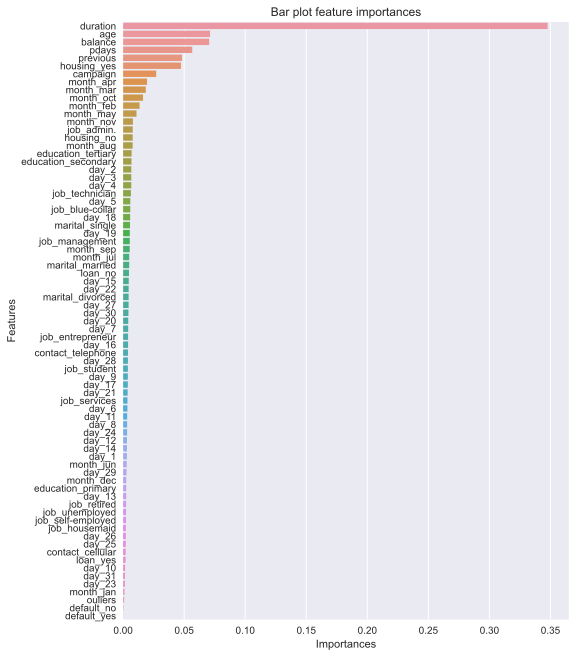

In [39]:
fig, ax = plt.subplots(figsize=(8, 11)) # фигура + координатная плоскость
feature = X_train_new.columns #признаки
feature_importances = model_dt.feature_importances_ # важность признаков
# создаем объект Series, чтобы отсортировать по важности признаки
feature_importances_series = pd.Series(
    data=feature_importances,
    index=feature
).sort_values(ascending=False)
# Строим столбчатую диаграмму
sns.barplot(x=feature_importances_series, y=feature_importances_series.index, ax=ax);
# Добавляем подпись графику, осям абцисс и ординат
ax.set_title('Bar plot feature importances')
ax.set_xlabel('Importances')
ax.set_ylabel('Features');

**Выводы:**
- метрики моделей упали
- логистическая регрессия опять показала себя лучше
- опять видно переобучения дерева решений
- та же 4-ка лидеров в важности признаков

## 5. Решение задачи классификации: ансамбли моделей

### 5.1. Случайный лес

In [40]:
# Создаем объект класса случайный лес
model_rf = ensemble.RandomForestClassifier(
    random_state = random_state 
)

# Обучаем модель 
model_rf.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = model_rf.predict(X_train_scaled)
y_pred_test = model_rf.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       1.00      1.00      1.00      4698
         yes       1.00      1.00      1.00      4231

    accuracy                           1.00      8929
   macro avg       1.00      1.00      1.00      8929
weighted avg       1.00      1.00      1.00      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.87      0.82      0.84      1175
         yes       0.81      0.87      0.84      1058

    accuracy                           0.84      2233
   macro avg       0.84      0.84      0.84      2233
weighted avg       0.84      0.84      0.84      2233



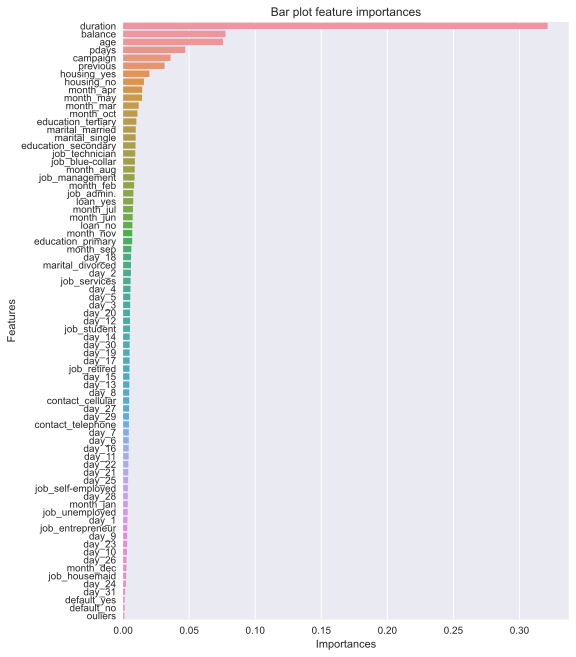

In [41]:
fig, ax = plt.subplots(figsize=(8, 11)) # фигура + координатная плоскость
feature = X_train_new.columns #признаки
feature_importances = model_rf.feature_importances_ # важность признаков
# создаем объект Series, чтобы отсортировать по важности признаки
feature_importances_series = pd.Series(
    data=feature_importances,
    index=feature
).sort_values(ascending=False)
# Строим столбчатую диаграмму
sns.barplot(x=feature_importances_series, y=feature_importances_series.index, ax=ax);
# Добавляем подпись графику, осям абцисс и ординат
ax.set_title('Bar plot feature importances')
ax.set_xlabel('Importances')
ax.set_ylabel('Features');

Модель опять переобучена, те же по важности признаки. 

### 5.2. Градиентный бустинг

In [42]:
# Создаем объект класса градиентный бустинг
model_gb = ensemble.GradientBoostingClassifier(
    random_state = random_state
)

model_gb.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = model_gb.predict(X_train_scaled)
y_pred_test = model_gb.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       0.87      0.83      0.85      4698
         yes       0.82      0.86      0.84      4231

    accuracy                           0.85      8929
   macro avg       0.85      0.85      0.85      8929
weighted avg       0.85      0.85      0.85      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.86      0.82      0.84      1175
         yes       0.81      0.85      0.83      1058

    accuracy                           0.84      2233
   macro avg       0.84      0.84      0.84      2233
weighted avg       0.84      0.84      0.84      2233



### 5.3. Стекинг

In [43]:
# Создаем список кортежей вида: (наименование модели, модель)
estimators = [
    ('log_reg', linear_model.LogisticRegression(
        random_state = random_state
    )),
    ('dt',  tree.DecisionTreeClassifier(
        random_state = random_state
    )),
    ('gb', ensemble.GradientBoostingClassifier(
        random_state = random_state
    ))
]

# Создаем объект класса стекинг
stacking_cl = ensemble.StackingClassifier(
    estimators=estimators,
    final_estimator=linear_model.LogisticRegression(
        random_state = random_state
    )
)

# Обучаем модель
stacking_cl.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = stacking_cl.predict(X_train_scaled)
y_pred_test = stacking_cl.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       0.89      0.86      0.88      4698
         yes       0.85      0.88      0.87      4231

    accuracy                           0.87      8929
   macro avg       0.87      0.87      0.87      8929
weighted avg       0.87      0.87      0.87      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.85      0.83      0.84      1175
         yes       0.82      0.84      0.83      1058

    accuracy                           0.84      2233
   macro avg       0.84      0.84      0.84      2233
weighted avg       0.84      0.84      0.84      2233



## 6. Итоги

<style type="text/css">
.tg  {border-collapse:collapse;border-spacing:0;}
.tg td{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-ihq5{background-color:#B0B3B2;color:#FB0207;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-9kw6{background-color:#B0B3B2;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-h2pf{background-color:#D4D4D4;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-8mdw{background-color:#B0B3B2;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-zvyz{background-color:#B0B3B2;text-align:left;vertical-align:top}
.tg .tg-rfng{background-color:#D4D4D4;text-align:left;vertical-align:top}
.tg .tg-0lax{text-align:left;vertical-align:top}
.tg .tg-pkkx{color:#E6000E;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-8mdw">Выборка</th>
    <th class="tg-9kw6" colspan="4">Train</th>
    <th class="tg-ihq5" colspan="4">Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-8mdw">Метрики</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-9kw6">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-ihq5">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
  </tr>
  <tr>
    <td class="tg-8mdw">Модели</td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Логистическая регрессия</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Дерево решений</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.74</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Случайный лес</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Градиентный бустинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Стекинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
</tbody>
</table>

**Выводы:**
- в целом целевая метрика ухудшилась
- снова логистическая регрессия показала себя лучше дерева решений, а ансамбли - отдельных моделей
- топ важных признаков тот же
- неожиданно выросли некоторые метрики класса "no", которые превысили аналогичные метрики класса "yes" у многих моделей
- учитывая падение метрик по целевому классу 'yes', и непонятный рост метрик по классу 'no', полагаю, что замена пропусков константами в категориальных признаках нецелесообразна

***

# Итерация №1. Baseline. Замена пропусков предсказаниями моделей ML

## 3. Подготовка данных

### 3.1. Выделяем целевую переменную и предикторы, разделяем выборку на обучающую и тестовую. Удаляем признак **poutcome**

In [44]:
# X - матрица наблюдений, y - столбец правильных ответов
X = df.drop(['deposit', 'poutcome'], axis=1) # удаляем признак poutcome
y = df['deposit']

### 3.2. Заполняем пропуски предсказаными значениями

In [45]:
# заплняем пропуски в признаке balance

features_with_nan = ['balance']

for feature in features_with_nan:
    # копируем датасет, удалив признаки с пропусками
    data = X.drop(['education', 'job', 'contact'], axis=1).copy()
    # выделяем категориальные признаки для кодирования
    categorial_cols = data.drop([
        'age', 'balance', 'duration', 'campaign', 'pdays', 'previous' # числовые признаки
        ], axis=1).columns.to_list()

    # выделяем тестовый датасет с пропусками признака 
    test_data = data[data[feature].isnull()]
    # убираем пропуски в копии основного датасета
    data.dropna(inplace=True)

    # определяем таргет для обучения   
    y_train = data[feature]
    # определяем тренировочную выборку без признаков с пропусками
    X_train = data.drop(features_with_nan, axis=1)
    # определяем тестовую выборку без признаков с пропусками
    X_test = test_data.drop(features_with_nan, axis=1)
    # новые тренировочные и тестовые выборки с кодированными категориальными признаками
    X_train_new, X_test_new = encode_cat_features(categorial_cols, X_train, X_test, y_train)

    # создаем и обучаем модель линейной регрессии
    model = linear_model.LinearRegression()
    model.fit(X_train_new, y_train)

    # предсказываем пропуски в признаке 
    y_pred = model.predict(X_test_new)

    # заполняем пропуски в основном датасете
    for i, ni in enumerate(test_data.index[:len(df)]):
        X[feature].loc[ni] = y_pred[i]

In [46]:
# заполняем пропуски в категориальных признаках

features_with_nan = ['job', 'education', 'contact']

for feature in features_with_nan:
    # копируем датасет
    data = X.copy()
    # выделяем категориальные признаки для кодирования, кроме education, job, contact (там есть пропуски)
    categorial_cols = data.drop([
        'age', 'balance', 'duration', 'campaign', 'pdays', 'previous', # числовые признаки
        'education', 'job', 'contact' # категориальные с пропусками
        ], axis=1).columns.to_list()

    # выделяем тестовый датасет с пропусками признака 
    test_data = data[data[feature].isnull()]
    # убираем пропуски в копии основного датасета
    data.dropna(inplace=True)

    # определяем таргет для обучения   
    y_train = data[feature]
    # определяем тренировочную выборку без категориальных признаков с пропусками
    X_train = data.drop(features_with_nan, axis=1)
    # определяем тестовую выборку без категориальных признаков с пропусками
    X_test = test_data.drop(features_with_nan, axis=1)
    # новые тренировочные и тестовые выборки с кодированными категориальными признаками
    X_train_new, X_test_new = encode_cat_features(categorial_cols, X_train, X_test, y_train)

    # создаем и обучаем модель логистической регрессии
    model = linear_model.LogisticRegression(random_state=42)
    model.fit(X_train_new, y_train)

    # предсказываем пропуски в признаке 
    y_pred = model.predict(X_test_new)

    # заполняем пропуски в основном датасете
    for i, ni in enumerate(test_data.index[:len(df)]):
        X[feature].loc[ni] = y_pred[i]
    


In [47]:
# Создаем тренировочную и тестовую выборки с помощью train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, # таблица с наблюдениями и столбец с правильным ответами
    test_size=0.2, # размер тестовой выборки
    random_state=random_state, # число отвечающее за генерацию случайных чисел
    stratify=y # стратификация, т.к. таргент несбалансирован
)

# Выводим размеры полученных выборок
print('Train shape: {}'.format(X_train.shape))
print('Test shape: {}'.format(X_test.shape))

Train shape: (8929, 15)
Test shape: (2233, 15)


### 3.2. Кодируем признаки

In [48]:
# признаки для OneHotEncoding
columns_to_change = [
    'job',
    'marital',
    'education',
    'default',
    'housing',
    'loan',
    'contact',
    'day',
    'month'
]
# кодируем тренировочную и тестовую выборки по отдельности, обучаясь на тренировочной
X_train_new, X_test_new = encode_cat_features(columns_to_change, X_train, X_test, y_train)

### 3.3. Поиск выбросов

In [49]:
# создаем признак для пометки выбросов
X_train_new['ouliers'] = 0
X_test_new['ouliers'] = 0

# используем класс EllipticEnvelope 
ee = EllipticEnvelope(contamination=0.01)
# обучаем и находим выбросы на тренировочной выборке
y_predicted_train = ee.fit_predict(X_train_new) 
# находим выбросы на тестовой выборке
y_predicted_test = ee.predict(X_test_new) 

# помечаем выбросы на тренировочной выборке
mask = y_predicted_train == -1
X_train_new.loc[mask, 'ouliers'] = 1

# помечаем выбросы на тестовой выборке
mask = y_predicted_test == -1
X_test_new.loc[mask, 'ouliers'] = 1

### 3.4. Нормализуем данные

In [50]:
# нормализуем данные

scaler = preprocessing.RobustScaler()             # RobustScaler показал себя чуть лучше
scaler.fit(X_train_new)                           # fit() только на train данных
X_train_scaled = scaler.transform(X_train_new)    # fransform() на train данных
X_test_scaled = scaler.transform(X_test_new)      # fransform() на test данных

## 4. Решение задачи классификации: логистическая регрессия и решающие деревья

### 4.1. Логистическая регрессия

In [51]:
# Создаём модель логистической регрессии
model_lr = linear_model.LogisticRegression(
    random_state = random_state
    )
 
# обучаем модель
model_lr.fit(X_train_scaled, y_train)

# делаем предсказание на тренировочной и тестовой выборке
y_train_pred = model_lr.predict(X_train_scaled)
y_test_pred = model_lr.predict(X_test_scaled)

# расчитываем и выводим метрику на тренировочной выборке
print('Train scores')
print(metrics.classification_report(y_train, y_train_pred))
print('-' * 60)
print('Test scores')
# расчитываем и выводим метрику на тестовой выборке
print(metrics.classification_report(y_test, y_test_pred))

Train scores
              precision    recall  f1-score   support

          no       0.81      0.84      0.83      4698
         yes       0.82      0.79      0.80      4231

    accuracy                           0.81      8929
   macro avg       0.81      0.81      0.81      8929
weighted avg       0.81      0.81      0.81      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.81      0.83      0.82      1175
         yes       0.80      0.79      0.80      1058

    accuracy                           0.81      2233
   macro avg       0.81      0.81      0.81      2233
weighted avg       0.81      0.81      0.81      2233



### 4.2. Дерево решений

In [52]:
# Создаём объект класса DecisionTreeClassifier
model_dt = tree.DecisionTreeClassifier(
    random_state = random_state 
)

# Обучаем дерево решений 
model_dt.fit(X_train_scaled, y_train)

# Делаем предсказание класса для тренировочных и тестовых данных
y_train_pred = model_dt.predict(X_train_scaled)
y_test_pred = model_dt.predict(X_test_scaled)

#Выводим отчёт о метриках классификации
print('Train scores')
print(metrics.classification_report(y_train, y_train_pred))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_test_pred))

Train scores
              precision    recall  f1-score   support

          no       1.00      1.00      1.00      4698
         yes       1.00      1.00      1.00      4231

    accuracy                           1.00      8929
   macro avg       1.00      1.00      1.00      8929
weighted avg       1.00      1.00      1.00      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.77      0.79      0.78      1175
         yes       0.76      0.74      0.75      1058

    accuracy                           0.76      2233
   macro avg       0.76      0.76      0.76      2233
weighted avg       0.76      0.76      0.76      2233



На примере дерева решений определим важность признаков

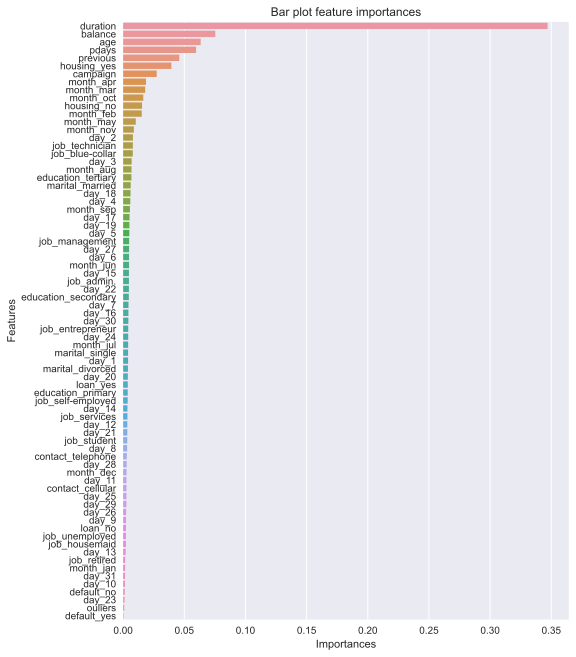

In [53]:
fig, ax = plt.subplots(figsize=(8, 11)) # фигура + координатная плоскость
feature = X_train_new.columns #признаки
feature_importances = model_dt.feature_importances_ # важность признаков
# создаем объект Series, чтобы отсортировать по важности признаки
feature_importances_series = pd.Series(
    data=feature_importances,
    index=feature
).sort_values(ascending=False)
# Строим столбчатую диаграмму
sns.barplot(x=feature_importances_series, y=feature_importances_series.index, ax=ax);
# Добавляем подпись графику, осям абцисс и ординат
ax.set_title('Bar plot feature importances')
ax.set_xlabel('Importances')
ax.set_ylabel('Features');

Выводы те же, что и при замене пропусков модой.

## 5. Решение задачи классификации: ансамбли моделей

### 5.1. Случайный лес

In [54]:
# Создаем объект класса случайный лес
model_rf = ensemble.RandomForestClassifier(
    random_state = random_state 
)

# Обучаем модель 
model_rf.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = model_rf.predict(X_train_scaled)
y_pred_test = model_rf.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       1.00      1.00      1.00      4698
         yes       1.00      1.00      1.00      4231

    accuracy                           1.00      8929
   macro avg       1.00      1.00      1.00      8929
weighted avg       1.00      1.00      1.00      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.87      0.82      0.84      1175
         yes       0.81      0.86      0.83      1058

    accuracy                           0.84      2233
   macro avg       0.84      0.84      0.84      2233
weighted avg       0.84      0.84      0.84      2233



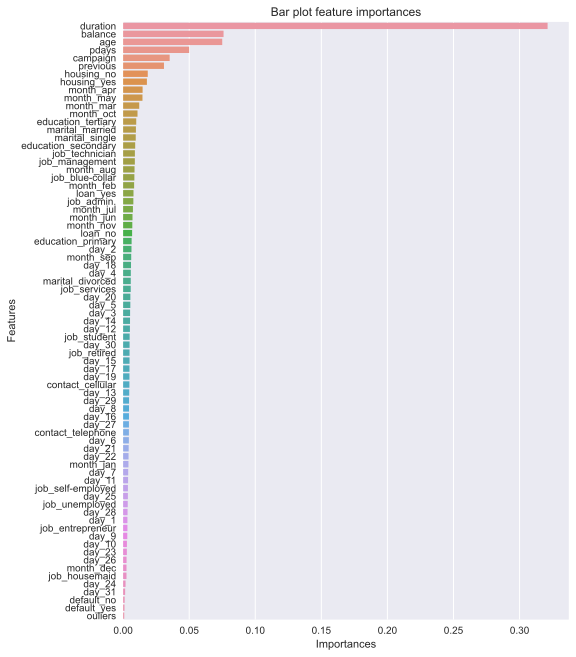

In [55]:
fig, ax = plt.subplots(figsize=(8, 11)) # фигура + координатная плоскость
feature = X_train_new.columns #признаки
feature_importances = model_rf.feature_importances_ # важность признаков
# создаем объект Series, чтобы отсортировать по важности признаки
feature_importances_series = pd.Series(
    data=feature_importances,
    index=feature
).sort_values(ascending=False)
# Строим столбчатую диаграмму
sns.barplot(x=feature_importances_series, y=feature_importances_series.index, ax=ax);
# Добавляем подпись графику, осям абцисс и ординат
ax.set_title('Bar plot feature importances')
ax.set_xlabel('Importances')
ax.set_ylabel('Features');

Важность признаков особо не изменилась. 

### 5.2. Градиентный бустинг

In [56]:
# Создаем объект класса градиентный бустинг
model_gb = ensemble.GradientBoostingClassifier(
    random_state = random_state
)

model_gb.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = model_gb.predict(X_train_scaled)
y_pred_test = model_gb.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       0.87      0.83      0.85      4698
         yes       0.82      0.86      0.84      4231

    accuracy                           0.85      8929
   macro avg       0.85      0.85      0.85      8929
weighted avg       0.85      0.85      0.85      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.86      0.82      0.84      1175
         yes       0.81      0.85      0.83      1058

    accuracy                           0.83      2233
   macro avg       0.83      0.83      0.83      2233
weighted avg       0.83      0.83      0.83      2233



### 5.3. Стекинг

In [57]:
# Создаем список кортежей вида: (наименование модели, модель)
estimators = [
    ('log_reg', linear_model.LogisticRegression(
        random_state = random_state
    )),
    ('dt',  tree.DecisionTreeClassifier(
        random_state = random_state
    )),
    ('gb', ensemble.GradientBoostingClassifier(
        random_state = random_state
    ))
]

# Создаем объект класса стекинг
stacking_cl = ensemble.StackingClassifier(
    estimators=estimators,
    final_estimator=linear_model.LogisticRegression(
        random_state = random_state
    )
)

# Обучаем модель
stacking_cl.fit(X_train_scaled, y_train)

# Делаем предсказание класса
y_pred_train = stacking_cl.predict(X_train_scaled)
y_pred_test = stacking_cl.predict(X_test_scaled)

# Выводим отчет о метриках
print('Train scores')
print(metrics.classification_report(y_train, y_pred_train))
print('-' * 60)
print('Test scores')
print(metrics.classification_report(y_test, y_pred_test))

Train scores
              precision    recall  f1-score   support

          no       0.89      0.86      0.88      4698
         yes       0.85      0.88      0.87      4231

    accuracy                           0.87      8929
   macro avg       0.87      0.87      0.87      8929
weighted avg       0.87      0.87      0.87      8929

------------------------------------------------------------
Test scores
              precision    recall  f1-score   support

          no       0.85      0.83      0.84      1175
         yes       0.82      0.83      0.83      1058

    accuracy                           0.83      2233
   macro avg       0.83      0.83      0.83      2233
weighted avg       0.83      0.83      0.83      2233



В целом, метрика также хуже, чем когда мы просто удалили пропуски. Неплохо показал себя случайный лес. Снова можно отметить более высокую метрику класса таргета "no".

## 6. Итоги

<style type="text/css">
.tg  {border-collapse:collapse;border-spacing:0;}
.tg td{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-ihq5{background-color:#B0B3B2;color:#FB0207;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-9kw6{background-color:#B0B3B2;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-h2pf{background-color:#D4D4D4;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-8mdw{background-color:#B0B3B2;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-zvyz{background-color:#B0B3B2;text-align:left;vertical-align:top}
.tg .tg-rfng{background-color:#D4D4D4;text-align:left;vertical-align:top}
.tg .tg-0lax{text-align:left;vertical-align:top}
.tg .tg-pkkx{color:#E6000E;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-8mdw">Выборка</th>
    <th class="tg-9kw6" colspan="4">Train</th>
    <th class="tg-ihq5" colspan="4">Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-8mdw">Метрики</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-9kw6">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-ihq5">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
  </tr>
  <tr>
    <td class="tg-8mdw">Модели</td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Логистическая регрессия</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Дерево решений</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.74</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Случайный лес</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Градиентный бустинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Стекинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
</tbody>
</table>

**Выводы:**
- в целом целевая метрика опять хуже, чем при удалении пропусков
- важность признаков для моделей деревьев примерно те же
- неожиданно снова выросла метрика класса "no"

Надо отметить, что модель для предсказания пропусков обучалась на всем датасете (!), а не отдельно на тренировочной выборке, и, тем не менее, результаты не впечатляют.

***

# Общие итоги и выводы по **Итерации №1. Baseline**

Метрика при удалении признаков.

<style type="text/css">
.tg  {border-collapse:collapse;border-spacing:0;}
.tg td{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-ihq5{background-color:#B0B3B2;color:#FB0207;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-9kw6{background-color:#B0B3B2;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-h2pf{background-color:#D4D4D4;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-8mdw{background-color:#B0B3B2;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-zvyz{background-color:#B0B3B2;text-align:left;vertical-align:top}
.tg .tg-rfng{background-color:#D4D4D4;text-align:left;vertical-align:top}
.tg .tg-0lax{text-align:left;vertical-align:top}
.tg .tg-pkkx{color:#E6000E;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-8mdw">Выборка</th>
    <th class="tg-9kw6" colspan="4">Train</th>
    <th class="tg-ihq5" colspan="4">Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-8mdw">Метрики</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-9kw6">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-ihq5">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
  </tr>
  <tr>
    <td class="tg-8mdw">Модели</td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Логистическая регрессия</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Дерево решений</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.77</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Случайный лес</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.89</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Градиентный бустинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.89</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Стекинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.90</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
</tbody>
</table>

Метрика при замене признаков константами.

<style type="text/css">
.tg  {border-collapse:collapse;border-spacing:0;}
.tg td{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-ihq5{background-color:#B0B3B2;color:#FB0207;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-9kw6{background-color:#B0B3B2;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-h2pf{background-color:#D4D4D4;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-8mdw{background-color:#B0B3B2;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-zvyz{background-color:#B0B3B2;text-align:left;vertical-align:top}
.tg .tg-rfng{background-color:#D4D4D4;text-align:left;vertical-align:top}
.tg .tg-0lax{text-align:left;vertical-align:top}
.tg .tg-pkkx{color:#E6000E;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-8mdw">Выборка</th>
    <th class="tg-9kw6" colspan="4">Train</th>
    <th class="tg-ihq5" colspan="4">Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-8mdw">Метрики</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-9kw6">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-ihq5">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
  </tr>
  <tr>
    <td class="tg-8mdw">Модели</td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Логистическая регрессия</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Дерево решений</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.74</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Случайный лес</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Градиентный бустинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Стекинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
</tbody>
</table>

Метрика при предсказании признаков моделями ML.

<style type="text/css">
.tg  {border-collapse:collapse;border-spacing:0;}
.tg td{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{border-color:black;border-style:solid;border-width:1px;font-family:Arial, sans-serif;font-size:14px;
  font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-ihq5{background-color:#B0B3B2;color:#FB0207;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-9kw6{background-color:#B0B3B2;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-h2pf{background-color:#D4D4D4;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-8mdw{background-color:#B0B3B2;font-weight:bold;text-align:left;vertical-align:top}
.tg .tg-zvyz{background-color:#B0B3B2;text-align:left;vertical-align:top}
.tg .tg-rfng{background-color:#D4D4D4;text-align:left;vertical-align:top}
.tg .tg-0lax{text-align:left;vertical-align:top}
.tg .tg-pkkx{color:#E6000E;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-8mdw">Выборка</th>
    <th class="tg-9kw6" colspan="4">Train</th>
    <th class="tg-ihq5" colspan="4">Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-8mdw">Метрики</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-9kw6">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
    <td class="tg-9kw6">Precision</td>
    <td class="tg-9kw6">Recall</td>
    <td class="tg-ihq5">F1-score</td>
    <td class="tg-9kw6">Accuracy</td>
  </tr>
  <tr>
    <td class="tg-8mdw">Модели</td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
    <td class="tg-zvyz"></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Логистическая регрессия</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.79</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.80</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Дерево решений</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.74</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.75</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.76</span></td>
  </tr>
  <tr>
    <td class="tg-rfng"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
    <td class="tg-0lax"></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Случайный лес</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">1.00</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-pkkx"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Градиентный бустинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.86</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.84</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.81</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
  <tr>
    <td class="tg-h2pf">Стекинг</td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.85</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.88</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.87</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.82</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#E6000E">0.83</span></td>
    <td class="tg-baqh"><span style="font-weight:normal;font-style:normal;color:#000">0.83</span></td>
  </tr>
</tbody>
</table>

**Выводы:**

- на данной итерации мы перепробовали разные методы обработки пропусков: 
    - удаление
    - замена константами
    - предсказание моделью ML
- использованы разные методы нормализации и стандартизация
- при удалении пропусков мы получаем более хорошие метрики, но уменьшаем размер датасета на 25% для обучения модели
- при замене пропусков константами или предсказанными значениями падает целевая метрика, и растут метрики класса 'no'
- учитывая изложенное в последних 2-х пунктах, полагаю, что правильная стратегия - удаление пропусков
---
- не был проведен нормальный разведывательный анализ данных и не были созданы новые признаки 
- модели обучения использовались с настройками по умолчанию, не были произведены настройки гиперпараметров
- не использовалась кросс-валидация
---            
- логистическая регрессия показала себя лучше, чем дерево решений
- ансамбли моделей показали себя лучше, чем отдельные модели
- дерево решений и случайный лес склонны к переобучению
- были выявлены важные признаки для обучения моделей дерева решений и случайного леса
---          
- отмечается резкий рост целевой мерики при замене пропусков в признаке **poutcome** модой в разрезе класса таргета (до 0.94-0.96), однако с учетом пропусков в данном признаке более 70% от всех значений, данная модель внушает серьезные опасения по поводу ее качества на новых данных. Удалена.

Будем пробовать улучшить результаты!